# <center>Проект для фонда «Shut Up and Take My Money» по исследованию рынка заведений общественного питания города Москвы</center>

## <center>Краткое описание проекта, основная цель и план действий</center>

**Краткое описание проекта:**
Исследование рынка заведений общественного питания города Москвы и общие рекомендации по открытию кофейни

**Основная цель проекта:**
Найти примечательные закономерности заведений общественного питания города Москвы и визуализировать их. А также дать рекомендации по открытию новой кофейни.

**План действий:**
1. Загрузка и ознакомление с данными
2. Предобработка данных
    - Создание столбца с названием улиц
    - Создание столбца с указанием на работу заведения 24/7
3. Провести анализ данных (визуализировать все этапы исследования)
4. Дать рекомендации по открытию кофейни


Входные данные представлены `.csv` файлом, содержащим 14 колонок с характеристиками заведений. 

## <center>Загрузка данных и ознакомление с данными</center>

In [1]:
# Импорт необходимых пакетов
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import folium
from textwrap import wrap
from matplotlib import pyplot, transforms

# Импорт исходных данных
data = pd.read_csv('moscow_places.csv')

In [2]:
# Озанкомление с данными
display(data.head(5))
data.info()

# Отображение количества уникальных имён заведений
display(data['name'].nunique())

# Проверка пропущенных данных
display(data.isna().sum())

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


5614

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

**ВЫВОДЫ:** 
- В данных представлено 5614 уникальных заведений
- В данных всего 14 столбцов:
    1. Название заведения; 8406 значений; нет пропущенных; тип данных - строка
    2. Категория заведения; 8406 значений; нет пропущенных; тип данных - строка
    3. Адрес заведения; 8406 значений; нет пропущенных; тип данных - строка
    4. Административный район для заведения; 8406 значений; нет пропущенных; тип данных - строка
    5. Дни и часы работы заведения; 7870 значений; 536 пропущенных; тип данных - строка
    6. Географическая широта для заведения; 8406 значений; нет пропущенных; тип данных - дробное число
    7. Географическая долгота для заведения; 8406 значений; нет пропущенных; тип данных - дробное число
    8. Рейтинг заведения; 8406 значений; нет пропущенных; тип данных - дробное число
    9. Категория цен заведения; 3315 значений; 5091 пропущенных; тип данных - строка
    10. Диапазон средней стоимости заказа; 3816 значений; 4590 пропущенных; тип данных - строка
    11. Средний счёт для заведения; 3149 значений; 5257 пропущенных; тип данных - дробное число
    12. Средняя цена чашки капучино; 535 значений; 7871 пропущенных; тип данных - дробное число
    13. Обозначение является ли заведение сетевым; 8406 значений; нет пропущенных; тип данных - целое число
    14. Количество посадочных мест; 4795 значений; 3611 пропущенных; тип данных - дробное число

## <center>Предобработка данных</center>

### Замена "неудобных" названий заведений

In [3]:
# Заменяем название "Кулинарная лавка братьев Караваевых" на "Лавка Караваевых"
data['name'] = data['name'].apply(lambda x: 'Лавка Караваевых' if x == 'Кулинарная лавка братьев Караваевых' else x)

# Добавляем новый столбец с сокращенными названиями округов
def dist_short(data):
    if data == 'Северный административный округ':
        return 'САО'
    elif data == 'Северо-Западный административный округ':
        return 'СЗАО'
    elif data == 'Северо-Восточный административный округ':
        return 'СВАО'
    elif data == 'Западный административный округ':
        return 'ЗАО'
    elif data == 'Центральный административный округ':
        return 'ЦАО'
    elif data == 'Восточный административный округ':
        return 'ВАО'
    elif data == 'Юго-Восточный административный округ':
        return 'ЮВАО'
    elif data == 'Южный административный округ':
        return 'ЮАО'
    elif data == 'Юго-Западный административный округ':
        return 'ЮЗАО'
    else:
        return data
    
data['district_short'] = data['district'].apply(dist_short)

### Проверка и обработка дубликатов

In [4]:
# Проверка и обработка дубликатов в данных
data.duplicated().sum()

0

### Проверка и обработка пропущенных значений

In [5]:
# Проверка пропущенных данных
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
district_short          0
dtype: int64

### Создание дополнительных столбцов

In [6]:
# Создаём столбец с названиями улиц
data['street'] = data['address'].str.rsplit(',').str[1]
data['street'] = data['street'].apply(lambda x: x[1:])
data['street']

0                 улица Дыбенко
1                 улица Дыбенко
2            Клязьминская улица
3       улица Маршала Федоренко
4           Правобережная улица
                 ...           
8401          Профсоюзная улица
8402      Пролетарский проспект
8403           Люблинская улица
8404           Люблинская улица
8405        Россошанский проезд
Name: street, Length: 8406, dtype: object

In [7]:
# Проверяем обозначения для "круглосуточных и ежедневных" заведений
data.loc[((data['hours'].str.contains('ежедневно', na=False)==True) &\
         (data['hours'].str.contains('круглосуточно', na=False)==True))|\
         ((data['hours'].str.contains('ежедневно', na=False)==True) &\
         (data['hours'].str.contains('00:00-00:00', na=False)==True))|\
         ((data['hours'].str.contains('пн-вс', na=False)==True) &\
         (data['hours'].str.contains('круглосуточно', na=False)==True)),:]['hours'].value_counts()

ежедневно, круглосуточно    730
Name: hours, dtype: int64

In [8]:
# Создаём столбец обозначающий "ежедневные и круглосуточные" заведения
data['is_24/7'] = data['hours'].apply(lambda x: True if x == 'ежедневно, круглосуточно' else False)
data['is_24/7'].sum()

730

**ВЫВОДЫ:**
- Дубликатов в данных не наблюдается.
- 6 столбцов содержат пропущенные значения. Достоверно заполнить их представляется возможным только с помощью парсинга. В рамках моей работы я решил не заполнять пропущенные значения.

## <center>Анализ данных</center>

### Категории заведений

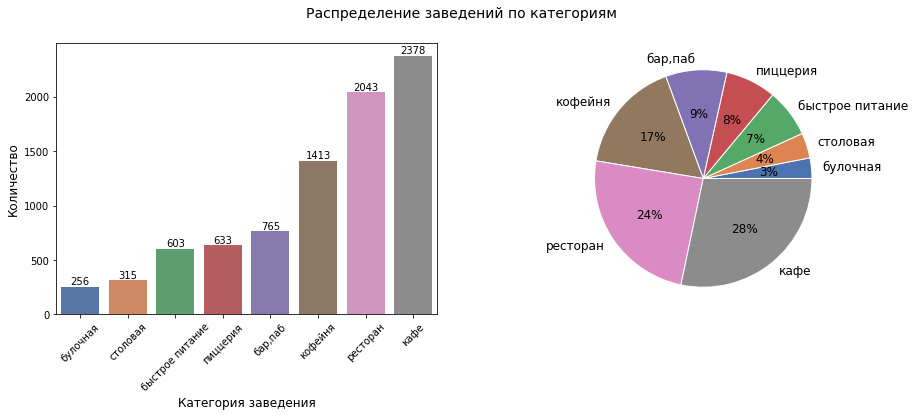

In [9]:
# Создаём столбчатую и круговую диаграмму в одном графике
sns.set_palette('deep') 

fig = plt.figure(figsize=(15,5))


plt.subplot2grid((1,2),(0,0))
ax1 = sns.barplot(x=data.pivot_table(index='category', values='name', aggfunc='count').sort_values(by='name').index, 
            y='name', 
            data=data.pivot_table(index='category', values='name', aggfunc='count').sort_values(by='name'))
ax1.bar_label(ax1.containers[0])

plt.xticks(rotation=45)
plt.xlabel('Категория заведения', fontsize=12)
plt.ylabel('Количество', fontsize=12)

plt.subplot2grid((1,2),(0,1))
ax2 = plt.pie(data.pivot_table(index='category', values='name', aggfunc='count').sort_values(by='name')['name'], 
       labels=data.pivot_table(index='category', values='name', aggfunc='count').sort_values(by='name').index,
       autopct='%.0f%%',
       textprops={'fontsize': 12},
       wedgeprops = { 'linewidth' : 1, 'edgecolor' : 'white' })


plt.suptitle('Распределение заведений по категориям', fontsize=14)
plt.show()

**ВЫВОДЫ:**
- больше всего заведений в категории кафе (28%) и ресторан (24%)
- на третьем месте по количеству заведений - кофейня (17%) 
- все остальные категории составляют 31% от общего числа заведений

### Количество посадочных мест по категориям

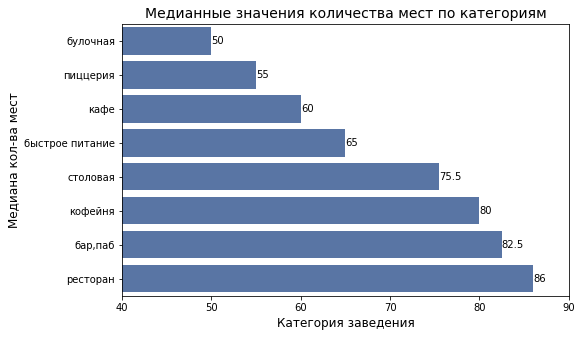

In [10]:
# Создаём столбчатую диаграмму
sns.set_palette('deep')

plt.figure(figsize=(8,5))

ax = sns.barplot(x='seats', 
            y=data.pivot_table(index='category', values='seats', aggfunc='median').sort_values(by='seats').index, 
            data=data.pivot_table(index='category', values='seats', aggfunc='median').sort_values(by='seats'),
            color=sns.color_palette()[0])
ax.bar_label(ax.containers[0])

plt.xlim(40, 90)
plt.title('Медианные значения количества мест по категориям', fontsize = 14)
plt.xticks(fontsize = 10)
plt.yticks(fontsize = 10)
plt.xlabel('Категория заведения', fontsize = 12)
plt.ylabel('Медиана кол-ва мест', fontsize = 12)
plt.show()

**ВЫВОДЫ:**
- взяли медианные значения посадочных мест, так как средние сильно искажены за счёт аномальных заведений с большим количеством посадочных мест
- самое большое медианное занчения посадочных мест у ресторанов, баров,пабов и кофееен соответственно
- самое маленькое медианное значения посадочных мест у булочных

### Соотношение сетевых и несетевых заведений

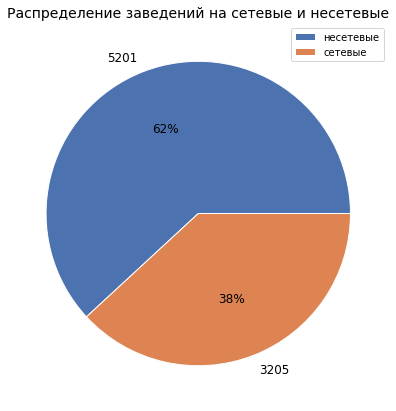

In [11]:
# Создаём круговую диаграмму
plt.figure(figsize=(10,7))

plt.pie(data.pivot_table(index='chain', values='name', aggfunc='count')['name'], 
       labels=[data.pivot_table(index='chain', values='name', aggfunc='count')['name'][0], 
           data.pivot_table(index='chain', values='name', aggfunc='count')['name'][1]],
       autopct='%.0f%%',
       textprops={'fontsize': 12},
       wedgeprops = { 'linewidth' : 1, 'edgecolor' : 'white' })

plt.title('Распределение заведений на сетевые и несетевые', fontsize =14)
plt.legend(['несетевые', 'сетевые'])
plt.show()

**ВЫВОДЫ:**
- соотношение сетевых и несетевых заведений примерно 2 к 3

### Категории сетевых заведений

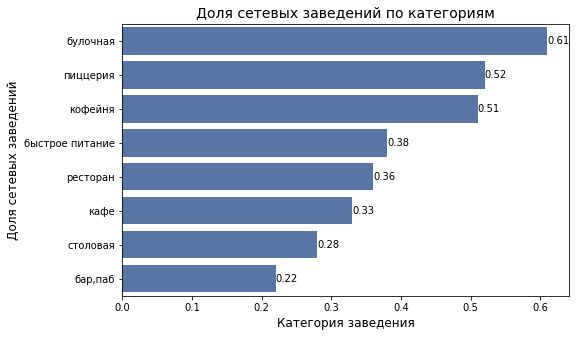

In [12]:
# Создаём столбчатую диаграмму
cat_chain = data.pivot_table(index='category', columns='chain', values='name', aggfunc='count')
cat_chain['sum'] = cat_chain.sum(axis=1)
cat_chain['share'] = round(cat_chain[1]/cat_chain['sum'], 2)
cat_chain.drop(columns=[0,1,'sum'], inplace=True)
cat_chain.sort_values(by='share', ascending=False, inplace=True)
#cat_chain = cat_chain.style.format("{:.2%}")
cat_chain

plt.figure(figsize=(8,5))

ax = sns.barplot(x='share', 
            y=cat_chain.index, 
            data=cat_chain,
            color=sns.color_palette('deep')[0])
ax.bar_label(ax.containers[0])

plt.title('Доля сетевых заведений по категориям', fontsize = 14)
plt.xticks()
plt.xlabel('Категория заведения', fontsize = 12)
plt.ylabel('Доля сетевых заведений', fontsize = 12)
plt.show()

**ВЫВОДЫ:**
- среди булочных больше всего сетевых заведений (61%)
- меньше всего сетевых заведений среди баров,пабов (22%)

### Топ-15 популярных сетей

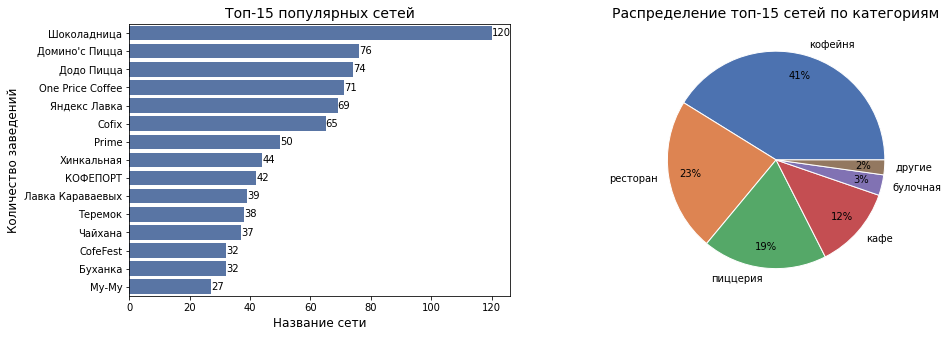

In [13]:
# Группируем данные, ищем категории популярных сетей
pop_names = data\
            .query('chain == 1')\
            .pivot_table(index='name', values='address', aggfunc='count')\
            .sort_values(by='address', ascending=False)\
            .head(15)

cat_of_pop = (data\
    .query('name in @pop_names.index')
    .pivot_table(index='category', values='name', aggfunc='count')
    .sort_values(by='name', ascending=False))

# Заменяем редкие категории на "другие"
cat_of_pop.reset_index(inplace=True)
others_df = pd.DataFrame({'category': ['другие'],
                    'name': [(cat_of_pop.loc[[5,6,7],:]['name'].sum())]})
cat_of_pop = pd.concat([cat_of_pop, others_df])
cat_of_pop.drop([5,6,7], inplace=True)
cat_of_pop.reset_index(drop=True, inplace=True)

# Строим стобчатую и круговую диаграммы
plt.figure(figsize=(15, 5))

plt.subplot2grid((1,2),(0,0))
ax1 = sns.barplot(x='address', 
            y=pop_names.index, 
            data=pop_names,
            color=sns.color_palette('deep')[0])
ax1.bar_label(ax1.containers[0])

plt.title('Топ-15 популярных сетей', fontsize = 14)
plt.xticks()
plt.xlabel('Название сети', fontsize = 12)
plt.ylabel('Количество заведений', fontsize = 12)

ax2 = plt.subplot2grid((1,2),(0,1))
plt.pie(cat_of_pop['name'], 
       labels = cat_of_pop['category'],
       autopct='%.0f%%',
       pctdistance = 0.8,
       labeldistance = 1.1,
       wedgeprops = { 'linewidth' : 1, 'edgecolor' : 'white' }
       )

plt.title('Распределение топ-15 сетей по категориям', fontsize = 14)

plt.show()

**ВЫВОДЫ:**
- Самая распространенная сеть заведений - "Шоколадница"
- Большинство из популярных сетей - кофейни (41%), затем идут рестораны (23%) и пиццерии (19%)

### Заведения по административным округам

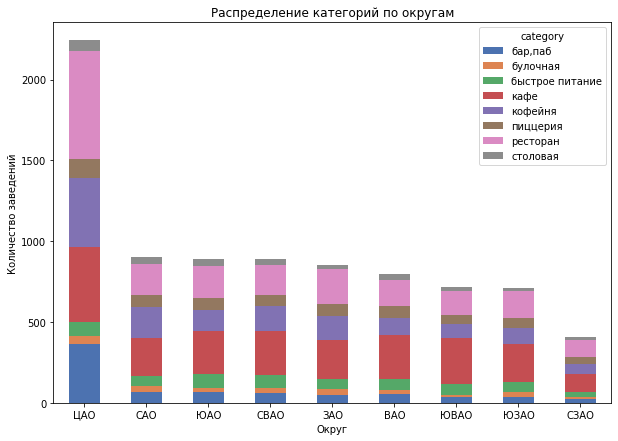

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
district_short,,,,,,,,
ЦАО,364,50,87,464,428,113,670,66
САО,68,39,58,235,193,77,189,41
ЮАО,68,25,85,264,131,73,202,44
СВАО,63,28,82,269,159,68,182,40
ЗАО,50,37,62,239,150,71,218,24
ВАО,53,25,71,272,105,72,160,40
ЮВАО,38,13,67,282,89,55,145,25
ЮЗАО,38,27,61,238,96,64,168,17
СЗАО,23,12,30,115,62,40,109,18


district_short
ЦАО     2242
САО      900
ЮАО      892
СВАО     891
ЗАО      851
ВАО      798
ЮВАО     714
ЮЗАО     709
СЗАО     409
dtype: int64

In [14]:
# Строим столбчутую диаграмму
sns.set_palette('deep') 
dist_cat = data.pivot_table(index=['district_short'], columns='category', values='name', aggfunc='count')

dist_cat['sum'] = dist_cat.sum(axis=1)
dist_cat.sort_values(by='sum', ascending=False, inplace=True)
dist_cat.drop(columns='sum', inplace=True)


ax = dist_cat.plot(kind='bar',
                   stacked=True, 
                   figsize=(10,7))

plt.xticks(rotation=0)
plt.xlabel('Округ')
plt.ylabel('Количество заведений')
plt.title('Распределение категорий по округам')
plt.show()

display(dist_cat, dist_cat.sum(axis=1))

**ВЫВОДЫ:**
- В данных присутствуют 9 административных округов города Москвы
- Больше всего заведений находится в Центральном административном округе
- Меньше всего заведений находится в Северном административном округе
- Больше всего в ЦАО находится ресторанов

### Средние рейтинги заведений по категориям

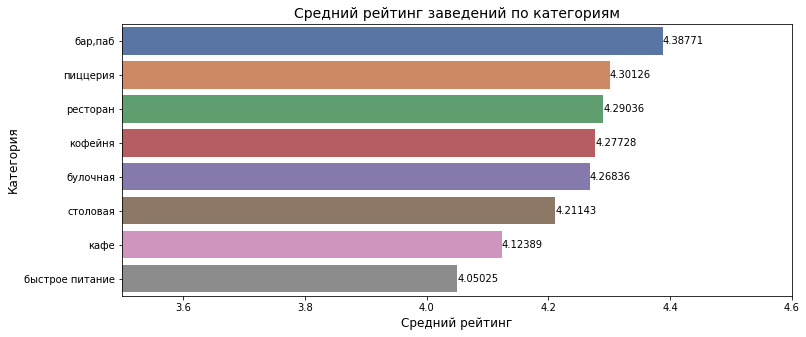

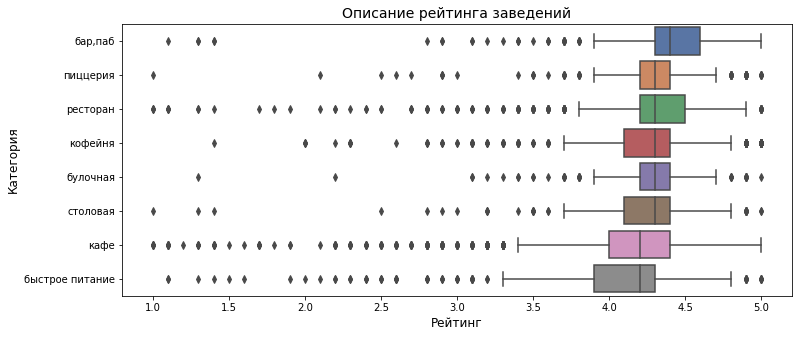

Средний рейтинг = 4.229895312871793
Процентное отношение самого высокого и самого низкого рейтинга = 7.69%


In [15]:
# Строим столбчатую диаграмму и диаграмму размаха
_ = data[['category', 'rating']].copy()
_['mean_rating'] = 'mean'
for cat in _.category.unique():
    _.loc[_[_['category'] == cat].index,'mean_rating'] = _.loc[_[_['category'] == cat].index,'rating'].mean()
_ = _.sort_values(by='mean_rating', ascending=False).reset_index(drop=True)
_

plt.figure(figsize=(12,5))

ax = sns.barplot(x='mean_rating', y='category', data=_.drop_duplicates('category'))
ax.bar_label(ax.containers[0])
plt.xlim(3.5,4.6)
plt.xlabel('Средний рейтинг', fontsize = 12)
plt.ylabel('Категория', fontsize = 12)
plt.title('Средний рейтинг заведений по категориям', fontsize = 14)

plt.figure(figsize=(12,5))

sns.boxplot(y='category', x='rating', data=_)

plt.title('Описание рейтинга заведений', fontsize=14)
plt.xlabel('Рейтинг', fontsize = 12)
plt.ylabel('Категория', fontsize = 12)

plt.show()

print('Средний рейтинг =', _['rating'].mean())
print('Процентное отношение самого высокого и самого низкого рейтинга =', 
      f'{round((1-_.mean_rating.min()/_.mean_rating.max())*100, 2)}%')

**ВЫВОДЫ:**
- Средний рейтинг всех заведений - 4.24
- Самый высокий срелний рейтинг у баров,пабов (4.38)
- Самый низкий средний рейтинг у заведений быстрого питания (4.05)
- В целом, средние рейтини различаются не сильно: самый низкий средний рейтинг ниже самого высокого на 7,69% высокого рейтинга

### Средний рейтинг заведений на карте

In [16]:
rating_df = data.pivot_table(index='district', values='rating', aggfunc='mean').reset_index()

# импортируем карту и хороплет
from folium import Map, Choropleth

# загружаем JSON-файл с границами округов Москвы
state_geo = 'admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

**ВЫВОДЫ:**
- Самый высокий средний рейтинг в Центральном административном округе
- Самый низкий средний рейтинг в Юго-Восточном админстративном округе

### Все заведения на карте

In [17]:
# импортируем карту и маркер
from folium import Map, Marker
# импортируем кластер
from folium.plugins import MarkerCluster

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

### Топ-15 улиц по количеству заведений

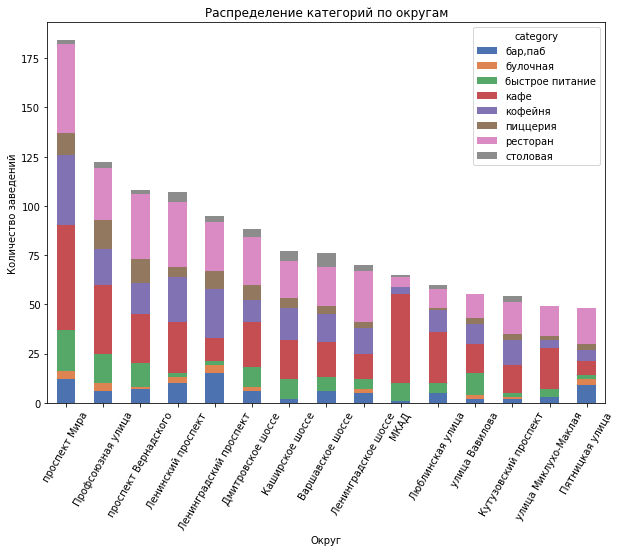

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
street,,,,,,,,
проспект Мира,12.0,4.0,21.0,53.0,36.0,11.0,45.0,2.0
Профсоюзная улица,6.0,4.0,15.0,35.0,18.0,15.0,26.0,3.0
проспект Вернадского,7.0,1.0,12.0,25.0,16.0,12.0,33.0,2.0
Ленинский проспект,10.0,3.0,2.0,26.0,23.0,5.0,33.0,5.0
Ленинградский проспект,15.0,4.0,2.0,12.0,25.0,9.0,25.0,3.0
Дмитровское шоссе,6.0,2.0,10.0,23.0,11.0,8.0,24.0,4.0
Каширское шоссе,2.0,NaN,10.0,20.0,16.0,5.0,19.0,5.0
Варшавское шоссе,6.0,NaN,7.0,18.0,14.0,4.0,20.0,7.0
Ленинградское шоссе,5.0,2.0,5.0,13.0,13.0,3.0,26.0,3.0


street
проспект Мира             184.0
Профсоюзная улица         122.0
проспект Вернадского      108.0
Ленинский проспект        107.0
Ленинградский проспект     95.0
Дмитровское шоссе          88.0
Каширское шоссе            77.0
Варшавское шоссе           76.0
Ленинградское шоссе        70.0
МКАД                       65.0
Люблинская улица           60.0
улица Вавилова             55.0
Кутузовский проспект       54.0
улица Миклухо-Маклая       49.0
Пятницкая улица            48.0
dtype: float64

In [18]:
sns.set_palette('deep') 

top_street = (
    data
    .pivot_table(index='street', values='name', aggfunc='count')
    .sort_values(by='name', ascending=False)
    .head(15)
    .reset_index()
)

street = top_street['street']

top_street_cat = (
    data
    .query('street in @street')
    .pivot_table(index='street', values='name', columns='category', aggfunc='count')
)

top_street_cat['sum'] = top_street_cat.sum(axis=1)
top_street_cat.sort_values(by='sum', ascending=False, inplace=True)
top_street_cat.drop(columns='sum', inplace=True)

ax = top_street_cat.plot(kind='bar', stacked=True, figsize=(10,7))

plt.xticks(rotation=60)
plt.xlabel('Округ')
plt.ylabel('Количество заведений')
plt.title('Распределение категорий по округам')
plt.show()

display(top_street_cat, top_street_cat.sum(axis=1))

**ВЫВОДЫ:**
- Больше всего заведений на проспекте Мира
- Меньше всего заведений на Пятницкой улице 
- Нет булочных на улицах: Каширское шоссе, Варшавское шоссе, МКАД, Люблинская, Миклухо-Маклая
- Нет пиццерий на улицах: МКАД, Люблинская
- Нет столовых на улицах: Вавилова, Миклухо-Маклая, Пятницкая

### Улицы только с одним заведением

chain                  0.342242
rating                 4.277646
seats                 59.972142
is_24/7                0.069004
middle_avg_bill      876.745865
middle_coffee_cup    186.166667
dtype: float64


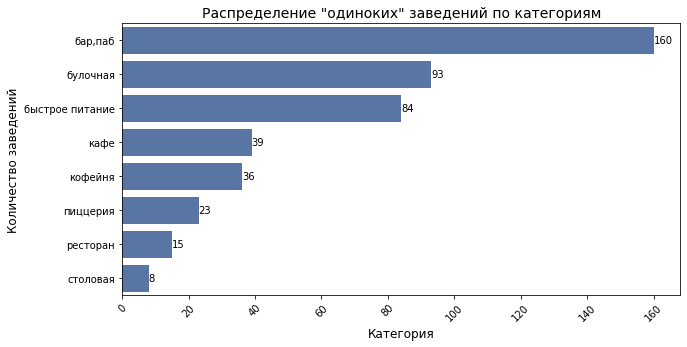

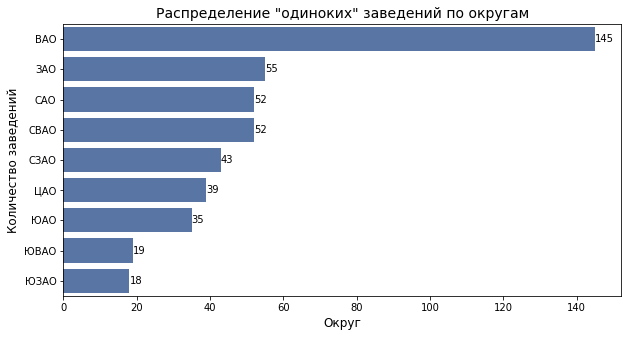

In [19]:
street_lonely = data.pivot_table(index='street', values='name', aggfunc='count').query('name == 1')
street_lonely = data.query('street in @street_lonely.index')

street_lonely_feature = (
    street_lonely
    .pivot_table(index='category', 
                 aggfunc={
                     'name':'count', 
                     'rating':'mean', 
                     'seats':'mean',
                     'is_24/7':'mean',
                     'middle_avg_bill':'mean',
                     'middle_coffee_cup':'mean',
                     'chain':'mean'
                 })
)

print(street_lonely_feature.aggregate(
    {
        'chain':'mean', 
        'rating':'mean',
        'seats':'mean',
        'is_24/7':'mean',
        'middle_avg_bill':'mean',
        'middle_coffee_cup':'mean'
    }))

plt.figure(figsize=(10,5))

ax1 = sns.barplot(y=street_lonely_feature.index, 
                  x='name', 
                  data=street_lonely_feature.sort_values(by='name', ascending=False),
                 color=sns.color_palette('deep')[0])
ax1.bar_label(ax1.containers[0])

plt.ylabel('Количество заведений', fontsize=12)
plt.xlabel('Категория', fontsize=12)
plt.title('Распределение "одиноких" заведений по категориям', fontsize=14)
plt.xticks(rotation=45)
plt.show()

street_lonely_dist = street_lonely.pivot_table(index='district_short', values='name', aggfunc='count')

plt.figure(figsize=(10,5))

ax2 = sns.barplot(y=street_lonely_dist.index, 
                  x='name', 
                  data=street_lonely_dist.sort_values(by='name', ascending=False),
                 color=sns.color_palette('deep')[0])
ax2.bar_label(ax2.containers[0])

plt.ylabel('Количество заведений', fontsize=12)
plt.xlabel('Округ', fontsize=12)
plt.title('Распределение "одиноких" заведений по округам', fontsize=14)
plt.show()

**ВЫВОДЫ:**
- Большинство "одиноких" заведений принадлежат к категории "бар,паб" и находятся в ВАО
- Меньшинство "одиноких" заведений принадлежат к категории "столовая" и находятся в ЮЗАО
- В среднем 34% таких заведений сетевые
- В среднем 7% таких заведений работают 24/7
- Среднее количество посадочных мест - 60
- Средний рейтинг - 4.28
- Средний чек - 877 рублей
- Средняя цена чашки капучино - 186 рублей

### Средний чек заведений по округам

In [20]:

avg_bill_dist = (
    data
    .pivot_table(index='district', values='middle_avg_bill', aggfunc='median')
    .sort_values(by='middle_avg_bill', ascending=False)
    .reset_index()
)

display(avg_bill_dist)

# импортируем карту и хороплет
from folium import Map, Choropleth

# загружаем JSON-файл с границами округов Москвы
state_geo = 'admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=avg_bill_dist,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m



,district,middle_avg_bill
0,Западный административный округ,1000.0
1,Центральный административный округ,1000.0
2,Северо-Западный административный округ,700.0
3,Северный административный округ,650.0
4,Юго-Западный административный округ,600.0
5,Восточный административный округ,575.0
6,Северо-Восточный административный округ,500.0
7,Южный административный округ,500.0
8,Юго-Восточный административный округ,450.0


**ВЫВОДЫ:**
- Самый высокий средний чек в ЦАО и ЗАО
- Самый низкий в ЮВАО

### Круглосуточные заведения по округам

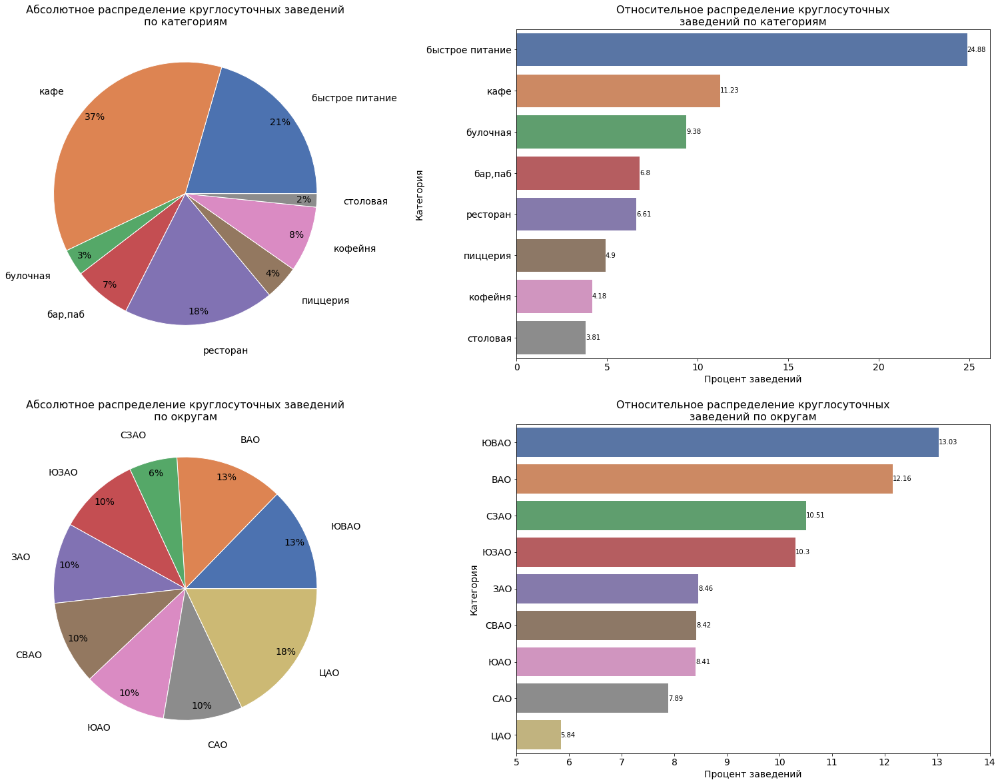

False    0.913157
True     0.086843
Name: is_24/7, dtype: float64

In [21]:
# Оставляем только круглосуточные заведения
at_atc = data.query('`is_24/7` == True')

# Считаем круглосуточные заведения по категориям
at_atc_cat = at_atc.pivot_table(index='category', values='name', aggfunc='count')

#Добавляем столбец с долей круглосуточных заведений в категории от всех заведений категории
at_atc_cat['share'] = round(
    at_atc_cat['name']
    .div(data.pivot_table(index='category', values='name', aggfunc='count')['name'])*100, 2)
at_atc_cat.sort_values(by='share', ascending=False, inplace=True)

# Считаем круглосуточные заведения по округам
at_atc_dist = at_atc.pivot_table(index='district_short', values='name', aggfunc='count')

#Добавляем столбец с долей круглосуточных заведений в округе от всех заведений округа
at_atc_dist['share'] = round(
    at_atc_dist['name'].div(data.pivot_table(index='district_short', values='name', aggfunc='count')['name'])*100, 2)
at_atc_dist.sort_values(by='share', ascending=False, inplace=True)

# Строим круговые и столбчатые диаграммы
plt.figure(figsize=(28,20))

plt.subplot2grid((2,2),(0,0))
ax1 = plt.pie(at_atc_cat['name'], 
       labels = at_atc_cat.index,
       autopct='%.0f%%',
       pctdistance = 0.9,
       labeldistance = 1.2,
        textprops={'fontsize': 14},
       wedgeprops = { 'linewidth' : 1, 'edgecolor' : 'white' })

plt.title('\n'.join(wrap('Абсолютное распределение круглосуточных заведений по категориям',50)), fontsize=16)

plt.subplot2grid((2,2),(0,1))
ax2 = sns.barplot(y=at_atc_cat.index, x='share', data=at_atc_cat)
ax2.bar_label(ax2.containers[0])

plt.title('\n'.join(wrap('Относительное распределение круглосуточных заведений по категориям',50)), fontsize=16)
plt.xlabel('Процент заведений', fontsize=14)
plt.ylabel('Категория', fontsize=14)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

plt.subplot2grid((2,2),(1,0))
ax3 = plt.pie(at_atc_dist['name'], 
       labels = at_atc_dist.index,
       autopct='%.0f%%',
       pctdistance = 0.9,
       labeldistance = 1.2,
        textprops={'fontsize': 14},
       wedgeprops = { 'linewidth' : 1, 'edgecolor' : 'white' })

plt.title('\n'.join(wrap('Абсолютное распределение круглосуточных заведений по округам',50)), fontsize=16)

plt.subplot2grid((2,2),(1,1))
ax4 = sns.barplot(y=at_atc_dist.index, x='share', data=at_atc_dist)
ax4.bar_label(ax4.containers[0])

plt.title('\n'.join(wrap('Относительное распределение круглосуточных заведений по округам',50)), fontsize=16)
plt.xlabel('Процент заведений', fontsize=14)
plt.ylabel('Категория', fontsize=14)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlim(5,14)

plt.show()

display(data['is_24/7'].value_counts(normalize=True))

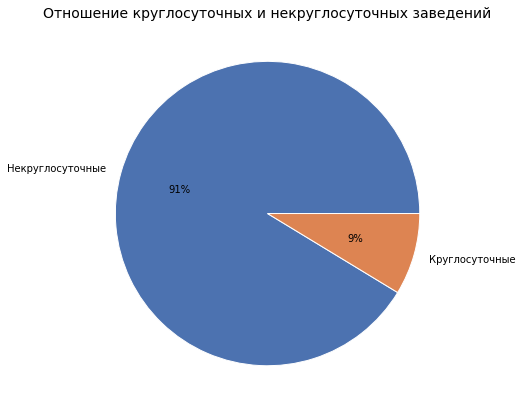

In [22]:
plt.figure(figsize=(17,7))

plt.pie(data.pivot_table(index='is_24/7', values='name', aggfunc='count')['name'], 
        labels=['Некруглосуточные', 'Круглосуточные'],
       autopct='%.0f%%',
       wedgeprops = { 'linewidth' : 1, 'edgecolor' : 'white' })

plt.title('Отношение круглосуточных и некруглосуточных заведений', fontsize=14)
plt.show()

**ВЫВОДЫ:**
- В абсолютном выражении больше всего круглосуточных заведений - это кафе (37%), однако от общего числа кафе круглосуточные кафе составляют 11,23%
- В относительном выражении больше всего круглосуточных заведений среди категории "быстрое питание" - 24,88%
- В абсолютном выражении меньше всего круглосуточных заведений - это столовые (2%), в относительном выражении столовых также меньше всего (3,81%)
- В абсолютном выражении больше всего круглосуточных заведений расположены в ЦАО (18%), однако от общего числа заведений в ЦАО круглосуточные составляют всего 5,84% (меньше всего)
- В абсолютном выражении меньше всего круглосуточных заведений расположены в СЗАО (6%), однако от общего числа заведений в СЗАО круглосуточные составляют 10,51% (третье место)
- В относительном выражении больше всего круглосуточных заведений в ЮВАО (13,03%)

### Заведения с плохим рейтингом

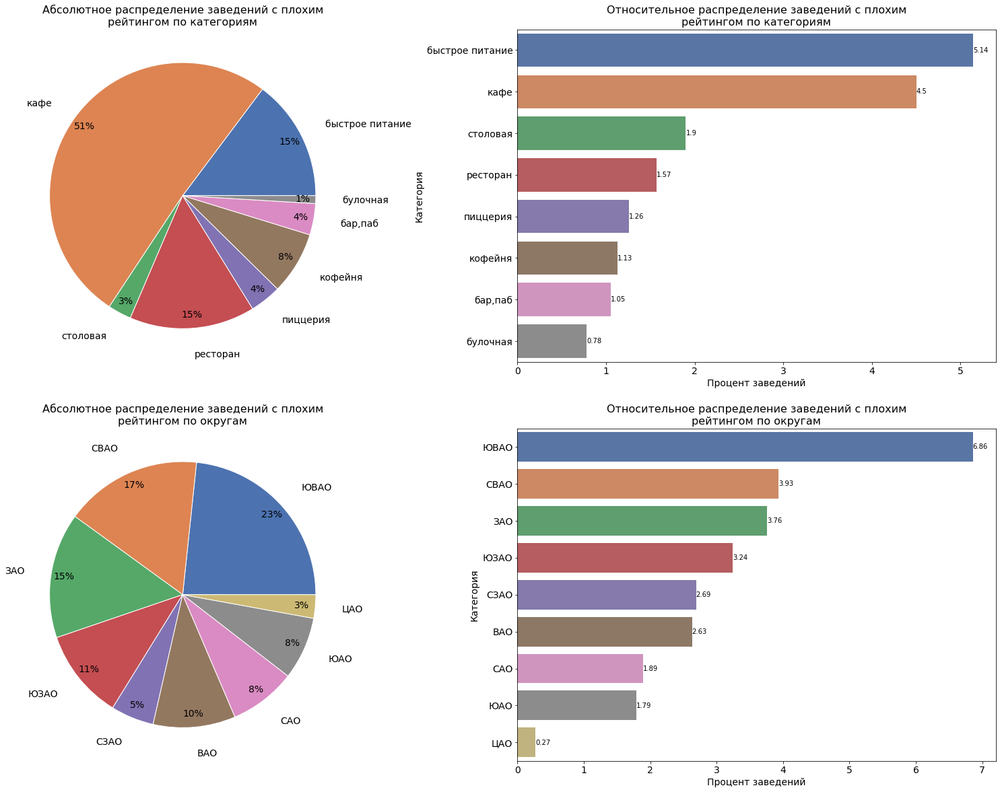

In [23]:
# Оставляем только круглосуточные заведения
low_rating = data.query('rating < 3')

# Считаем круглосуточные заведения по категориям
low_rating_cat = low_rating.pivot_table(index='category', values='name', aggfunc='count')

#Добавляем столбец с долей заведений с плохим рейтингом в категории от всех заведений категории
low_rating_cat['share'] = round(
    low_rating_cat['name']
    .div(data.pivot_table(index='category', values='name', aggfunc='count')['name'])*100, 2)
low_rating_cat.sort_values(by='share', ascending=False, inplace=True)

# Считаем круглосуточные заведения по округам
low_rating_dist = low_rating.pivot_table(index='district_short', values='name', aggfunc='count')

#Добавляем столбец с долей заведений с плохим рейтингом в округе от всех заведений округа
low_rating_dist['share'] = round(
    low_rating_dist['name'].div(data.pivot_table(index='district_short', values='name', aggfunc='count')['name'])*100, 2)
low_rating_dist.sort_values(by='share', ascending=False, inplace=True)

# Строим круговые и столбчатые диаграммы
plt.figure(figsize=(28,20))

plt.subplot2grid((2,2),(0,0))
ax1 = plt.pie(low_rating_cat['name'], 
       labels = low_rating_cat.index,
       autopct='%.0f%%',
       pctdistance = 0.9,
       labeldistance = 1.2,
        textprops={'fontsize': 14},
       wedgeprops = { 'linewidth' : 1, 'edgecolor' : 'white' })

plt.title('\n'.join(wrap('Абсолютное распределение заведений с плохим рейтингом по категориям',50)), fontsize=16)

plt.subplot2grid((2,2),(0,1))
ax2 = sns.barplot(y=low_rating_cat.index, x='share', data=low_rating_cat)
ax2.bar_label(ax2.containers[0])

plt.title('\n'.join(wrap('Относительное распределение заведений с плохим рейтингом по категориям',50)), fontsize=16)
plt.xlabel('Процент заведений', fontsize=14)
plt.ylabel('Категория', fontsize=14)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

plt.subplot2grid((2,2),(1,0))
ax3 = plt.pie(low_rating_dist['name'], 
       labels = low_rating_dist.index,
       autopct='%.0f%%',
       pctdistance = 0.9,
       labeldistance = 1.2,
        textprops={'fontsize': 14},
       wedgeprops = { 'linewidth' : 1, 'edgecolor' : 'white' })

plt.title('\n'.join(wrap('Абсолютное распределение заведений с плохим рейтингом по округам',50)), fontsize=16)

plt.subplot2grid((2,2),(1,1))
ax4 = sns.barplot(y=low_rating_dist.index, x='share', data=low_rating_dist)
ax4.bar_label(ax4.containers[0])

plt.title('\n'.join(wrap('Относительное распределение заведений с плохим рейтингом по округам',50)), fontsize=16)
plt.xlabel('Процент заведений', fontsize=14)
plt.ylabel('Категория', fontsize=14)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

plt.show()

**ВЫВОДЫ:**
- В абсолютном выражении больше половины заведений с рейтингом ниже 3 - это кафе, однако относительно всех кафе  с плохим рейтингом составляют 4,5% (второе место)
- В относительном выражении больше всего заведений в категории "быстрое питание" - 5,14%
- В абсолютном выражении меньше всего заведений с рейтингом ниже 3 в категории "булочная" (1%), в относительном выражении булочные также на последнем месте - всего 0,78%
- В абсолютном выражении почти четверть всех заведений с плохим рейтингом расположены в ЮВАО (23%), в относительном выражении ЮВАО также на первом месте - 6,86%
- В абсолютном выражении район с самым малым количеством заведений с рейтингом ниже 3 - ЦАО (3%), в относительном ЦАО также на последенм месте - всего 0,27%

### Общие выводы

**Категории заведений:**
- Топ-3 категорий по количеству заведений: кафе - 28%, ресторан - 24%, кофейня - 17%
- Топ-3 категорий по медианному количеству посадочных мест: ресторан - 86 мест, бар/паб - 82,5 места, кофейня - 80 мест
</br>

**Сетевые заведения:**
- Несетевых заведений примерно в 1,5 раза больше, чем сетевых
- Больше всего сетевых заведений среди булочных (61% булочных - сетевые)
- Самая распространённая сеть заведений - "Шоколадница"
- Больше всего из Топ-15 сетей по количеству заведений - кофейни (41%)
</br>

**Округа Москвы:**
- В данных представлены 9 основных администривных округов Москвы
- Больше всего заведений расположены в Центральном административном округе
- В Центральном административном округе больше всего ресторанов
</br>

**Рейтинги заведений:**
- Средний рейтинг всех заведений - 4,24 пункта
- Самый высокий рейтинг у баров/пабов (4,38)
- Самый высокий средний рейтинг у заведений Центрального административного округа
- Самое большое относительное количество заведений с рейтингом ниже 3 пунктов имеют категорию "быстрое питание": среди всех заведений быстрого питания 5,14% с рейтингом ниже 3 пунктов
- Самое большое относительное количество заведений с рейтингом ниже 3 пунтков расположены в ЮВАО: среди всех заведений в ЮВАО 6,86% имеют рейтинг ниже 3 пунктов
</br>

**Улицы, на которых находятся заведения:**
- Больше  всего заведений находится на проспекте Мира
- Меньше всего заведений находится на Пятнцикой улице
</br>

**Средний чек заведений:**
- Самый высокий средний чек у заведений в ЦАО и ЗАО
- Самый низкий средний чек у заведений в ЮВАО
</br>

**Часы работы заведений:**
- Только 9% всех заведений круглосуточные
- Среди всех категорий заведений относительное количество круглосуточных больше у категории "быстрое питание": среди всех заведений быстрого питания 24,88% круглосуточные
- Среди всех округов относительное количество круглостуочных заведений больше в ЮВАО: среди всех завдеений ЮВАО 13,03% круглостуочные
</br>

## Детализация исследования. Открытие кофейни

### Сколько кофеен в датасете?

In [24]:
# Считаем количество кофеен
data.query('category == "кофейня"')['name'].count()

1413

**ВЫВОДЫ:**
- В данных 1413 кофеен

### Сколько круглосуточных кофеен в датасете?

In [25]:
# Считаем количество круглосуточных кофеен
data.query('category == "кофейня" and `is_24/7` == True')['name'].count()

59

**ВЫВОДЫ:**
- В данных 59 круглосуточных кофеен

### Распределение рейтингов кофеен

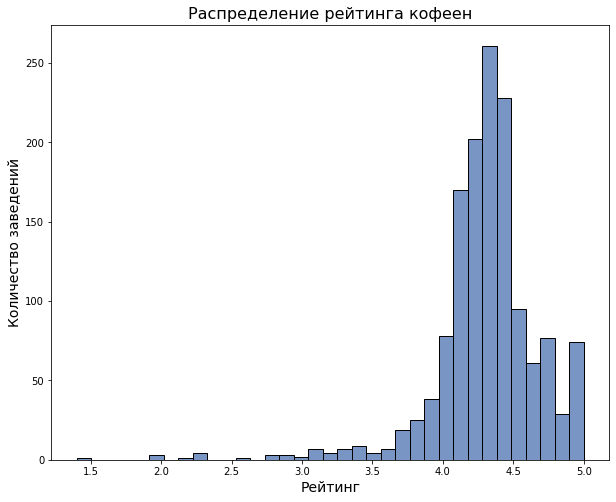

count    1413.000000
mean        4.277282
std         0.372250
min         1.400000
25%         4.100000
50%         4.300000
75%         4.400000
max         5.000000
Name: rating, dtype: float64

16

In [26]:
# Смотрим на рейтинги кофеен
cof_house = data.query('category == "кофейня"')

# Строим гистограмму
plt.figure(figsize=(10,8))

sns.histplot(cof_house['rating'], bins=35)

plt.title('Распределение рейтинга кофеен', fontsize=16)
plt.xlabel('Рейтинг', fontsize=14)
plt.ylabel('Количество заведений', fontsize=14)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.show()

display(cof_house['rating'].describe())
display(cof_house.query('rating < 3')['name'].count())

**ВЫВОДЫ:**
- Распределение рейтингов кофеен (гистограмма) скошенно в право
- Медианный и средний рейтинг кофеен почти совпадает - 4,28 и 4,3 соответственно
- В данных есть 16 кофеен с рейтингом меньше 3

### Распределение кофеен по округам

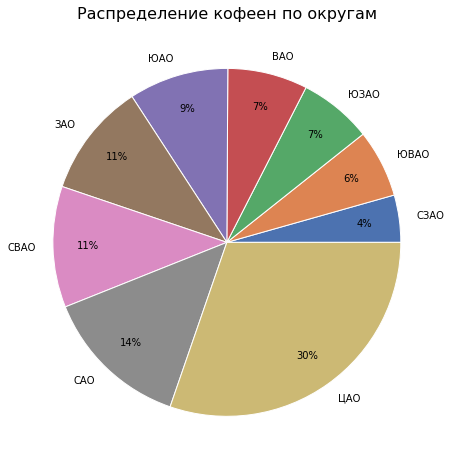

In [27]:
# Создаём сводную таблицу кофеен по округам
cof_house_dist = cof_house.pivot_table(index='district_short', values='name', aggfunc='count').sort_values(by='name')

# Строим круговую диаграмму
plt.figure(figsize=(15,8))

plt.pie(cof_house_dist['name'], 
       labels=cof_house_dist.index,
       autopct='%.0f%%',
       pctdistance = 0.8,
       labeldistance = 1.1,
       textprops={'fontsize': 10},
       wedgeprops = { 'linewidth' : 1, 'edgecolor' : 'white' })

plt.title('Распределение кофеен по округам', fontsize=16)
plt.show()

**ВЫВОДЫ:**
- Больше всего кофеен находится в ЦАО
- Меньше всего кофеен находится в СЗАО

### Ориентир для стоимости чашки капучино

In [28]:
print('Медианная стоимость чашки капучино в ЦАО:', cof_house.query('district_short == "ЦАО"')['middle_coffee_cup'].median())
print('Средняя стоимость чашки капучино в ЦАО:', cof_house.query('district_short == "ЦАО"')['middle_coffee_cup'].mean())
print()
print('Медианная стоимость чашки капучино в Москве:', cof_house['middle_coffee_cup'].median())
print('Средняя стоимость чашки капучино в Москве:', cof_house['middle_coffee_cup'].mean())

Медианная стоимость чашки капучино в ЦАО: 190.0
Средняя стоимость чашки капучино в ЦАО: 187.5185185185185

Медианная стоимость чашки капучино в Москве: 170.0
Средняя стоимость чашки капучино в Москве: 175.0556621880998


**ВЫВОДЫ:**
- В случае, если планируется открыть одно несетевое заведение, его следует открывать в ЦАО, как там проходимость выше, чем в других округах города. В таком случае можно ориентироваться на диапазон между медианным и средним значением средней стоимости чашки капучино в ЦАО: **187-190 рублей**

</br>

- В случае, если планируется открывать сеть заведений во всём городе, можно ориентироваться на диапазон между медианным и средним значением средней стоимости чашки капучино в Москве: **170-175 рублей**

### Соотношение сетевых и несетевых кофеен

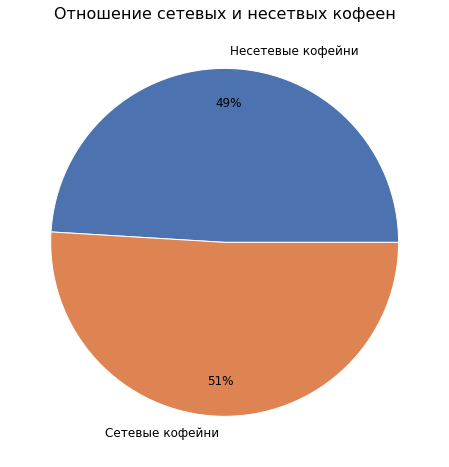

In [29]:
cof_house_chain = cof_house.pivot_table(index='chain', values='name', aggfunc='count')

# Строим круговую диаграмму
plt.figure(figsize=(15,8))

plt.pie(cof_house_chain['name'], 
       labels=['Несетевые кофейни', 'Сетевые кофейни'],
       autopct='%.0f%%',
       pctdistance = 0.8,
       labeldistance = 1.1,
       textprops={'fontsize': 12},
       wedgeprops = { 'linewidth' : 1, 'edgecolor' : 'white' })

plt.title('Отношение сетевых и несетвых кофеен', fontsize=16)
plt.show()

**ВЫВОДЫ:**
- Кофейни делятся на сетевые и несетвые примерно пополам : 51% и 49% соответственно

### Соотношение круглосуточных и некруглосуточных кофеен

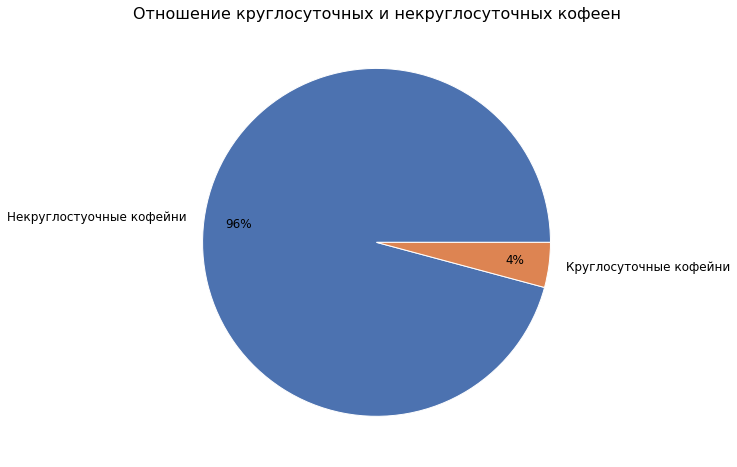

In [30]:
cof_house_atc_ad = cof_house.pivot_table(index='is_24/7', values='name', aggfunc='count')

# Строим круговую диаграмму
plt.figure(figsize=(15,8))

plt.pie(cof_house_atc_ad['name'], 
       labels=['Некруглостуочные кофейни', 'Круглосуточные кофейни'],
       autopct='%.0f%%',
       pctdistance = 0.8,
       labeldistance = 1.1,
       textprops={'fontsize': 12},
       wedgeprops = { 'linewidth' : 1, 'edgecolor' : 'white' })

plt.title('Отношение круглосуточных и некруглосуточных кофеен', fontsize=16)
plt.show()

**ВЫВОДЫ:**
- Абсолютное большинство (96%) кофеен **не работают круглосуточно**

### Рекомендации по открытию кофейни

**ВЫВОДЫ:**
В своей рекомендации исхожу из того, что изначально будет открываться только одно заведение (для которого я и даю рекомендации), даже в случае наличия планов по открытию сети заведений.
</br>

Есть два подхода к открытию кофейни (по моему мнению):
 1. При отсутствии уникального торгового предложения (УТП) стоит избегать соседства с большим количеством конкурентов, пожертвовав при этом проходимостью (конкуренты не дураки - открывают заведения, где большая проходимость)
 2. При наличии УТП имеет смысл размещать заведение в местах с большой проходимостью, не боясь соседства с большим количеством конкурентов (наше УТП сделает свое дело и мы займём свою нишу, несмотря на конкуренцию)
</br>

Размещать первое заведение имеет смысл именно в Центральном административном округе (ЦАО) в обоих случаях, чтобы не сильно терять в проходимости

В связи с вышесказанным, ниже приводятся две карты:
 1. 5 самых популярных улиц с большим количеством конкурентов (и большой проходимостью соответственно)
 2. 120 наименее популярных улиц с низким количеством конкурентов (и низкой проходимостью соответственно)
</br>

Исходя из условий у нас подразумевается "сильное" УТП - сходство с кофейней из сериала "Друзья". Такое УТП непременно привлечёт фанатов сериала. Таким образом, окончательной рекомендацией является следовать варианту 1 - открывать кофейню на одной из 5 популярных улиц.

In [31]:
# Ищем названия улицы с наименьшим количеством кофеен
cof_house_str_low = (
    cof_house
    .query('district_short == "ЦАО"')
    .pivot_table(index='street', values='name', aggfunc='count')
    .query('name == 1').index
)

# Ищем названия улицы с наибольшим количеством кофеен
cof_house_str_high = (
    cof_house
    .query('district_short == "ЦАО"')
    .pivot_table(index='street', values='name', aggfunc='count')
    .sort_values(by='name', ascending=False)
    .head(5).index
)

In [32]:
# подключаем библиотеку
from folium import Marker, Map

# moscow_lat - широта, moscow_lng – долгота
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=12)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его на карту
def create_marker(row):
    Marker([row['lat'], row['lng']],
        popup=f"{row['street']}"
    ).add_to(m)

# применяем функцию для создания маркера к первым 5 записям датафрейма
data.query('street in @cof_house_str_high and district_short == "ЦАО"').drop_duplicates(subset='street').apply(create_marker, axis=1)
    
# выводим карту
m

In [33]:
# импортируем карту и маркер
from folium import Map, Marker
# импортируем кластер
from folium.plugins import MarkerCluster

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=12)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['street']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.query('street in @cof_house_str_low').drop_duplicates(subset='street').apply(create_clusters, axis=1)

# выводим карту
m